In [1]:
import pandas as pd
from preprocessing_functions import *
import seaborn as sns
from  matplotlib import pyplot as plt
import spacy
import ast

In [2]:
df_a_su_u = pd.read_csv("/home/deduce-ubuntu/Tesi/Tesi/bozze_df_analysis_sentiment/df_a_type_interaction_su_u.csv", parse_dates = ["time"])
df_a_u_u = pd.read_csv("/home/deduce-ubuntu/Tesi/Tesi/bozze_df_analysis_sentiment/df_a_type_interaction_user_user.csv", parse_dates = ["time"])
# df_l_su_u = pd.read_csv("/home/deduce-ubuntu/Tesi/Tesi/bozze_df_analysis_sentiment/df_lungs_type_interaction.csv", parse_dates = ["time"])
# df_l_u_u = pd.read_csv("/home/deduce-ubuntu/Tesi/Tesi/bozze_df_analysis_sentiment/df_lungs_type_interaction_user_user_total.csv",  parse_dates = ["time"])

In [4]:
# df_a_su_u["text_lemmatised"] = df_a_su_u["text_lemmatised"].apply(ast.literal_eval)
# df_a_u_u["text_lemmatised"] = df_a_u_u["text_lemmatised"].apply(ast.literal_eval)
df_l_su_u["text_lemmatised"] = df_l_su_u["text_lemmatised"].apply(ast.literal_eval)
df_l_u_u["text_lemmatised"] = df_l_u_u["text_lemmatised"].apply(ast.literal_eval)

In [6]:
# df_a_su_u["text_lemmatised"] = df_a_su_u["text_lemmatised"].apply(lambda x: " ".join(x))
# df_a_u_u["text_lemmatised"] = df_a_u_u["text_lemmatised"].apply(lambda x: " ".join(x))
df_l_su_u["text_lemmatised"] = df_l_su_u["text_lemmatised"].apply(lambda x: " ".join(x))
df_l_u_u["text_lemmatised"] = df_l_u_u["text_lemmatised"].apply(lambda x: " ".join(x))

In [26]:
df_l_u_u = df_l_u_u[~ df_l_u_u.duplicated(["text", "author"])]

In [9]:
def process_posts(df):
    index_na = df[df["text_processed"].isna()].index
    df_fake = processing(df.loc[index_na].drop(["text_processed", "text_lemmatised"], axis = 1).reset_index(drop = True))
    df_fake.set_index(index_na, inplace = True)
    df.loc[index_na, "text_processed"] = df_fake["text_processed"]
    df.loc[index_na, "text_lemmatised"] = df_fake["text_lemmatised"]
    return df

In [ ]:
# df_a_su = pd.read_csv("/home/deduce-ubuntu/Tesi/Tesi/bozze_df_analysis_sentiment/df_a_type_interaction_su_u.csv", parse_dates = ["time"])
# df_a_u = pd.read_csv("/home/deduce-ubuntu/Tesi/Tesi/bozze_df_analysis_sentiment/df_a_type_interaction_user_user.csv", parse_dates = ["time"])
df_l_su = pd.read_csv("/home/deduce-ubuntu/Tesi/Tesi/bozze_df_analysis_sentiment/df_lungs_type_interaction.csv", parse_dates = ["time"])
df_l_u = pd.read_csv("/home/deduce-ubuntu/Tesi/Tesi/bozze_df_analysis_sentiment/df_lungs_user_user_type_interaction.csv", parse_dates = ["time"])

In [20]:
# df_l_su_u = process_posts(df_l_su_u)
# df_l_u_u = processing(df_l_u_u)
# df_l_su_u = processing(df_l_su_u)
df_l_u_u = processing(df_l_u_u)

In [9]:
print(df_a_su_u.shape)
print(df_a_u_u.shape)
print(df_a_su_u.shape[0] + df_a_u_u.shape[0])
print(df_l_su_u.shape)
print(df_a_u_u.shape)
print(df_l_su_u.shape[0] + df_l_u_u.shape[0])

(49605, 19)
(51468, 18)
101073
(261956, 19)
(51468, 18)
595164


In [4]:
type_replied_posts(df_a_su_u)
print("")
type_replied_posts(df_l_su_u)
print("")
type_replied_posts(df_a_u_u)
print("")
type_replied_posts(df_l_u_u)

in the df there's 39.22 of negative comments
in the df there's 24.65 of positive comments
in the df there's 36.14 of neutral comments

in the df there's 27.77 of negative comments
in the df there's 43.7 of positive comments
in the df there's 28.53 of neutral comments

in the df there's 34.78 of negative comments
in the df there's 33.22 of positive comments
in the df there's 32.01 of neutral comments

in the df there's 30.2 of negative comments
in the df there's 40.66 of positive comments
in the df there's 29.14 of neutral comments


In [10]:
df_a_su_u["type_interaction"].unique()

array(['no_reply_to_su', 'no_change', 'only_positive', 'no_interaction',
       'only_su', 'change_sentiment'], dtype=object)

In [10]:
print(df_a_su_u[df_a_su_u["type_interaction"] == "no_reply_to_su"]["thread"].unique().shape[0])
print(df_a_su_u[df_a_su_u["type_interaction"] == "no_change"]["thread"].unique().shape[0])
print(df_a_su_u[df_a_su_u["type_interaction"] == "only_positive"]["thread"].unique().shape[0])
print(df_a_su_u[df_a_su_u["type_interaction"] == "no_interaction"]["thread"].unique().shape[0])
print(df_a_su_u[df_a_su_u["type_interaction"] == "only_su"]["thread"].unique().shape[0])
print(df_a_su_u[df_a_su_u["type_interaction"] == "change_sentiment"]["thread"].unique().shape[0])

3797
1306
5832
828
669
1624


In [3]:
stats_sentiment(df_a_u_u, type_= "USER")
print("")
stats_sentiment(df_l_u_u, type_= "USER")

out of 31184 threads there are: 
   17288 threads in which there is only positive sentiment   55.44%
   1208 in which there's no sentiment change    3.87%
   8553 in which there's no interaction with super-user    27.43%
   3363 in which there's no reply to the super-user answer    10.78%
   772 in which there's a sentiment change    2.48%
the mean number of interactions for a sentiment change are 1.57 with a std of  1.1

out of 124217 threads there are: 
   55359 threads in which there is only positive sentiment   44.57%
   8783 in which there's no sentiment change    7.07%
   15412 in which there's no interaction with super-user    12.41%
   35149 in which there's no reply to the super-user answer    28.3%
   9514 in which there's a sentiment change    7.66%
the mean number of interactions for a sentiment change are 1.29 with a std of  0.87


### Topic modeling

In [2]:
from bertopic import BERTopic
import textwrap

/home/deduce-ubuntu/Tesi/Tesi/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-07-17 21:35:07.293362: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-17 21:35:08.195022: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-17 21:35:08.195179: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-17 21:3

In [14]:
df_a_su_u["text_lemmatised"] = df_a_su_u["text_lemmatised"].apply(lambda x: " ".join(x))
df_a_u_u["text_lemmatised"] = df_a_u_u["text_lemmatised"].apply(lambda x: " ".join(x))
df_l_su_u["text_lemmatised"] = df_l_su_u["text_lemmatised"].apply(lambda x: " ".join(x))
df_l_u_u["text_lemmatised"] = df_l_u_u["text_lemmatised"].apply(lambda x: " ".join(x))

In [15]:
# docs = df_a_su_u['text_lemmatised'].to_list()[:1000]
docs = df_l_u_u[~ df_l_u_u.duplicated("text_lemmatised")]["text_lemmatised"].to_list()
# docs = pd.concat([df_a_su_u[~ df_a_su_u.duplicated("text_lemmatised")]["text_lemmatised"], df_a_u_u[~ df_a_u_u.duplicated("text_lemmatised")]["text_lemmatised"]], ignore_index= True).to_list()

topic_model = BERTopic()
topics, probs = topic_model.fit_transform(docs)


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [16]:
embedding_model = "sentence-transformers/all-MiniLM-L6-v2"
# topic_model.save("/home/deduce-ubuntu/Tesi/Tesi/Bertopic/lungs_u_u", serialization="safetensors", save_ctfidf=True, save_embedding_model=embedding_model)

In [18]:
docs = pd.concat([df_l_su_u[~ df_l_su_u.duplicated("text_lemmatised")]["text_lemmatised"], df_l_u_u[~ df_l_u_u.duplicated("text_lemmatised")]["text_lemmatised"]], ignore_index= True).to_list()

topic_model = BERTopic()
topics, probs = topic_model.fit_transform(docs)

embedding_model = "sentence-transformers/all-MiniLM-L6-v2"
# topic_model.save("/home/deduce-ubuntu/Tesi/Tesi/Bertopic/lungs_tot", serialization="safetensors", save_ctfidf=True, save_embedding_model=embedding_model)

: 

In [23]:
topic_model.get_topic_info()[:15] # a_total

,Topic,Count,Name,Representation,Representative_Docs
0,-1,46605,-1_asthma_feel_not_day,"[asthma, feel, not, day, work, chest, think, h...",[month 5 rocky road asthma diagnose 3rd preven...
1,0,1393,0_child_daughter_son_school,"[child, daughter, son, school, old, young, par...",[hello new 7 year old son recently diagnose as...
2,1,1291,1_vaccine_jab_flu_vaccination,"[vaccine, jab, flu, vaccination, group, vaccin...",[definitely follow asthma nurse hard question ...
3,2,855,2_asthmauk_uk_asthma_asthmagirl,"[asthmauk, uk, asthma, asthmagirl, asthmatic, ...","[check asthmauk, asthmauk, post asthmauk]"
4,3,845,3_symbicort_smart_puff_regime,"[symbicort, smart, puff, regime, duoresp, 2006...","[not think symbicort ill ask try thank, symbic..."
5,4,720,4_pollen_hayfever_hay_fever,"[pollen, hayfever, hay, fever, grass, tree, an...","[people good control asthma trigger pollen, gr..."
6,5,609,5_steroid_inhaled_inhale_oral,"[steroid, inhaled, inhale, oral, inhaler, dose...","[give steroid inhaler, inhaled steroid work co..."
7,6,553,6_222_0300_5800_helpline,"[222, 0300, 5800, helpline, nurse, uk, mf, rin...",[hide sorry hear frustrate especially winter c...
8,7,530,7_thrush_rinse_mouth_tooth,"[thrush, rinse, mouth, tooth, gargle, brush, t...",[brush tooth take inhaler suggest accompany in...
9,8,523,8_peak_flow_predict_average,"[peak, flow, predict, average, meter, height, ...",[realise 8 month ago see reply read agree asth...


In [145]:
topic_model.get_topic_info()[:15] # a_su_u

,Topic,Count,Name,Representation,Representative_Docs
0,-1,21895,-1_asthma_not_feel_need,"[asthma, not, feel, need, day, inhaler, know, ...",[steroid inhaler mean take everyday usually tw...
1,0,632,0_reflux_acid_stomach_gaviscon,"[reflux, acid, stomach, gaviscon, omeprazole, ...",[way look life good long recover acid reflux i...
2,1,531,1_child_son_daughter_old,"[child, son, daughter, old, cough, young, diag...",[teenage year difficult imagine find awkard ne...
3,2,437,2_nasal_sinus_spray_polyp,"[nasal, sinus, spray, polyp, nose, smell, drip...",[sinus rinse steroid nasal spray regularly hel...
4,3,422,3_uk_asthmauk_asthma_link,"[uk, asthmauk, asthma, link, thank, asthmatic,...","[thank asthma uk appreciate, thank read asthma..."
5,4,408,4_thrush_rinse_voice_mouth,"[thrush, rinse, voice, mouth, gargle, tooth, t...",[tendancy lose voice humidity low stuffy nose ...
6,5,314,5_prescription_pharmacy_pharmacist_medication,"[prescription, pharmacy, pharmacist, medicatio...","[prescription, need discuss pharmacist explain..."
7,6,270,6_hosp_home_ward_ae,"[hosp, home, ward, ae, con, lol, talk, hospita...",[know wish clone good one lol hope stay wildly...
8,7,259,7_breath_chest_day_breathing,"[breath, chest, day, breathing, asthma, sympto...",[revelation week unfortunately life incredibly...
9,8,253,8_nurse_helpline_uk_222,"[nurse, helpline, uk, 222, 0300, 5800, ring, s...",[try take asthma uk helpline monday sure sound...


In [8]:
topic_model.get_topic_info()[:15] #a-u-u

,Topic,Count,Name,Representation,Representative_Docs
0,-1,24067,-1_asthma_not_feel_chest,"[asthma, not, feel, chest, think, help, know, ...",[persistent cough month mainly bad night wake ...
1,0,790,0_steroid_dose_inhaler_prednisone,"[steroid, dose, inhaler, prednisone, inhaled, ...",[steroid inhaler increase puff twice day mean ...
2,1,685,1_son_daughter_child_school,"[son, daughter, child, school, old, cough, you...",[sorry hear daughter son bad montelukast inhal...
3,2,640,2_vaccine_jab_flu_vaccination,"[vaccine, jab, flu, vaccination, group, booste...","[flu jab flu check infection, tell month gp fl..."
4,3,471,3_nasal_sinus_spray_polyp,"[nasal, sinus, spray, polyp, nose, drip, ent, ...",[sinusitis time scan show sinus passage block ...
5,4,452,4_steroid_card_oral_course,"[steroid, card, oral, course, weight, dose, st...","[5 day course oral steroid finish today, talk ..."
6,5,443,5_symbicort_smart_duoresp_puff,"[symbicort, smart, duoresp, puff, change, vent...",[change symbicort fostair nurse tell 6 week ch...
7,6,366,6_thrush_mouth_rinse_gargle,"[thrush, mouth, rinse, gargle, tooth, oral, to...",[ask tell rinse gargle take symbicort swim exe...
8,7,349,7_inhaler_change_new_spacer,"[inhaler, change, new, spacer, aerochamber, th...","[inhaler work, thank inhaler, inhaler]"
9,8,330,8_employer_union_disability_adjustment,"[employer, union, disability, adjustment, occu...",[far work go union seek help union rep send oc...


In [12]:
topic_model.get_topic_info()[:15] # lungs_total

,Topic,Count,Name,Representation,Representative_Docs
0,-1,202243,-1_copd_asthma_chest_cough,"[copd, asthma, chest, cough, infection, bronch...",NaN
1,0,3493,0_vape_smoke_smoking_quit,"[vape, smoke, smoking, quit, cigarette, nicoti...",NaN
2,1,2724,1_oxygen_oximeter_level_ambulatory,"[oxygen, oximeter, level, ambulatory, organ, p...",NaN
3,2,2171,2_cancer_radiotherapy_nodule_chemo,"[cancer, radiotherapy, nodule, chemo, tumour, ...",NaN
4,3,2143,3_transplant_list_donor_harefield,"[transplant, list, donor, harefield, assessmen...",NaN
5,4,1970,4_reflux_acid_omeprazole_hernia,"[reflux, acid, omeprazole, hernia, gaviscon, h...",NaN
6,5,1829,5_dog_collie_pup_puppy,"[dog, collie, pup, puppy, vet, spaniel, animal...",NaN
7,6,1643,6_foundation_british_buddy_lung,"[foundation, british, buddy, lung, lungie, for...",NaN
8,7,1369,7_emphysema_bullous_moderate_stage,"[emphysema, bullous, moderate, stage, severe, ...",NaN
9,8,1273,8_laugh_chuckle_humour_joke,"[laugh, chuckle, humour, joke, funny, laughter...",NaN


In [9]:
topic_model.get_topic_info()[:15] #lu-su-u

,Topic,Count,Name,Representation,Representative_Docs
0,-1,94378,-1_cough_lung_copd_say,"[cough, lung, copd, say, hospital, test, feel,...",[thank explanatory reply feel exercise cause b...
1,0,3092,0_oxygen_concentrator_cylinder_portable,"[oxygen, concentrator, cylinder, portable, oxi...",[hiif 5lpm continuous assess set 5 pulse deliv...
2,1,1588,1_vape_smoke_smoking_quit,"[vape, smoke, smoking, quit, nicotine, cigaret...",[positive effect responsibly quit vape quit sm...
3,2,918,2_carole_pete_love_hug,"[carole, pete, love, hug, john, dear, sheila, ...","[carole carole care xx, carole, carole 2]"
4,3,904,3_mask_wear_exempt_face,"[mask, wear, exempt, face, protect, visor, sho...","[risk wear mask, need mask, thank wear mask]"
5,4,898,4_transplant_list_qe_assessment,"[transplant, list, qe, assessment, double, don...",[sorry hear need lung transplant hope go thank...
6,5,897,5_christmas_merry_happy_xmas,"[christmas, merry, happy, xmas, new, peaceful,...","[s good hear merry christmas happy new year, t..."
7,6,858,6_emphysema_stage_diagnose_severe,"[emphysema, stage, diagnose, severe, mild, mod...","[thank reply emphysema think ok try, emphysema..."
8,7,772,7_breathing_lip_purse_breathe,"[breathing, lip, purse, breathe, relaxed, gent...",[try purse lip breathing number people find he...
9,8,762,8_copd_diagnose_mild_moderate,"[copd, diagnose, mild, moderate, severe, stage...","[thank read copd, live copd, copd]"


In [17]:
topic_model.get_topic_info()[:15] # lu_u_u

,Topic,Count,Name,Representation,Representative_Docs
0,-1,108218,-1_chest_cough_lung_asthma,"[chest, cough, lung, asthma, infection, feel, ...",[honest learn similar symptom make sense feel ...
1,0,4114,0_smoke_smoking_quit_cigarette,"[smoke, smoking, quit, cigarette, smoker, vape...","[copd smoke, stop 3 year ago lung bad think sm..."
2,1,1350,1_copd_diagnose_severe_moderate,"[copd, diagnose, severe, moderate, stage, mild...","[love copd, good copd xx, life not copd]"
3,2,1259,2_dog_collie_pup_puppy,"[dog, collie, pup, puppy, vet, spaniel, breed,...","[lovely dog want, walk dog, nice dog love dog]"
4,3,1118,3_transplant_list_donor_assessment,"[transplant, list, donor, assessment, double, ...","[good luck hope wait long transplant, s old lu..."
5,4,1053,4_beach_sea_scotland_cornwall,"[beach, sea, scotland, cornwall, devon, north,...",[live new forest area local beach lepe isle wi...
6,5,1026,5_christmas_merry_xmas_happy,"[christmas, merry, xmas, happy, santa, new, he...","[merry christmas, merry christmas hope good, l..."
7,6,1025,6_oxygen_oximeter_level_ambulatory,"[oxygen, oximeter, level, ambulatory, pulse, o...","[thank oxygen try, oxygen 8 year, oxygen]"
8,7,1012,7_emphysema_stage_bullous_diagnose,"[emphysema, stage, bullous, diagnose, severe, ...",[want hear experience people emphysema year di...
9,8,1006,8_gym_exercise_yoga_treadmill,"[gym, exercise, yoga, treadmill, bike, walk, c...","[good join gym hope enjoy good wish, walk good..."


In [142]:
for i in range(1,10):
    print(textwrap.fill(df_docs[df_docs.Topic == 13].iloc[i].Document, 150), end = "\n\n")

vaccination important reduce disease severity transmission go flu far good source new old pfizer test transmission glad ok get covid protection

yes thank know professional eggfree flu vaccine stick flu feel awful peak flow drop 125 course steriod trick not mind get husband immune compromise
get vaccine honestly not know able hold vaccinated

possibly 65 slightly different vaccine 65 easy age group vaccine

surgery covid flu 2 weekend october option get early vaccine deliver nhs guideline guideline depend availability staff vaccine

ps year surgery run flu vaccine invite wait anymore

gp surgery not take booking month not date take booking assume not know order vaccination arrive boot fully book december believe recurrent problem gp
surgery receive vaccine base order usually wait late october early november appointment 30 october year year late decemberone year arrange vaccination
boot not invite gp surgery january year not vaccinate chaotic phone appointment surgery stop take booking 

In [124]:
text = topic_model.get_topic_info()["Representative_Docs"][0]
print(textwrap.fill(df_a_su_u[df_a_su_u["text_lemmatised"] == text[0]].text.item(), 150))

HiYour steroid inhaler is meant to be taken everyday (usually twice). Your reliever inhaler (usually blue) usually shouldn’t be needed, and if you’re
needing it regularly (3+ doses a week) you are classed as uncontrolled. If you’re using your preventer as prescribed and still having issues contact
your GP for a review. If you aren’t doing so, try and use it as suggested and see if it helps. Exercise is a common trigger for asthma, as such that
many people are told to use their reliever before it. If you have the common ‘puff’ style blue inhaler, 1 dose is 2 puffs. Usually this is enough to
stop issues. If you then develop asthma symptoms (like tight chest etc) you should stop and take another dose of your reliever and wait for it to kick
in (up to 15 mins), before slowly getting back in to it. If you are symptomatic, don’t ‘push through’ it as it’s likely to make your asthma worse.
Cold air is also a known trigger for asthma. Remember to breathe in through your nose and you may want to

In [127]:
df_docs = topic_model.get_document_info(docs)

In [53]:
topic_model.get_topic_info().loc[0].Representative_Docs[0]

'month 5 rocky road asthma diagnose 3rd preventative inhaler previous 2 cutting sereflo blue inhaler everyday fail multiple time nasal spray pnd blue inhaler help tightness wheeze positive attack new symptom week include general breathlesness go upstairs etc lift weight home nature breathe require lifting suit run marathon october manage 2 mile anymore literally significant improvement new breathlessness little symptom add equation phone doctor work trigger sound wheezy effect job home life mood make depressed honest try med try alter diet abandon run altogether effect voice feel strain psyche wordy conversation covid endless test doctor think plus antibody test state virus guess feel option play rule thing properly spacer etc clean late chat doctor 2 week ago let review 2 month pre twice easy stage 2 set antibiotic chest ray come clear 38 asthma uk nurse lovely feel well practically go forward feel like need plan sorry rant feel sea'

### Visualization

In [35]:
year_month_series = pd.concat([df_a_su_u[~ df_a_su_u.duplicated("text_lemmatised")]["time"], df_a_u_u[~ df_a_u_u.duplicated("text_lemmatised")]["time"]], ignore_index= True).dt.to_period('M')
distinct_months = year_month_series.nunique()
distinct_months

94

In [55]:
timestamps = pd.concat([df_a_su_u[~ df_a_su_u.duplicated("text_lemmatised")]["time"], df_a_u_u[~ df_a_u_u.duplicated("text_lemmatised")]["time"]], ignore_index= True).to_list()
topics_over_time = topic_model.topics_over_time(docs, timestamps, nr_bins = 94)

topic_model.visualize_topics_over_time(topics_over_time, topics=[i for i in range(10)])

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hoverinfo': 'text',
              'hovertext': [<b>Topic 0</b><br>Words: son, child, worthe, brother,
                            daughter, <b>Topic 0</b><br>Words: daughter,
                            aminophillyn, son, child, cpap, <b>Topic
                            0</b><br>Words: daughter, son, croup, child, whooping,
                            <b>Topic 0</b><br>Words: son, daughter, child, grow,
                            young, <b>Topic 0</b><br>Words: son, uni, daughter,
                            child, alicat, <b>Topic 0</b><br>Words: son, child,
                            daughter, alergic, school, <b>Topic 0</b><br>Words:
                            son, classic, cva, child, 2xday, <b>Topic
                            0</b><br>Words: springy, son, child, move,
                            spraysingular, <b>Topic 0</b><br>Words: son, child,
                            daughter, baby, grandson, <b>Topic 0</b><br>Words:
                            daughter, child, school, teacher, son, <b>Topic
                            0</b><br>Words: son, child, daughter, kid, school,
                            <b>Topic 0</b><br>Words: son, child, famous, daughter,
                            vegetarian, <b>Topic 0</b><br>Words: daughter, baby,
                            child, son, kid, <b>Topic 0</b><br>Words: son,
                            breastfe, daughter, child, grandmother, <b>Topic
                            0</b><br>Words: child, inhayler, son, daughter, young,
                            <b>Topic 0</b><br>Words: daughter, child, son, kid,
                            old, <b>Topic 0</b><br>Words: daughter, child, son,
                            brown, parenting, <b>Topic 0</b><br>Words: grandson,
                            child, daughter, brother, mother, <b>Topic
                            0</b><br>Words: son, child, childhood, kathsorry,
                            stocky, <b>Topic 0</b><br>Words: son, child, uncle,
                            autohaler, fixotide, <b>Topic 0</b><br>Words: son,
                            child, school, daughter, young, <b>Topic
                            0</b><br>Words: tooth, son, daughter, ethan, rot,
                            <b>Topic 0</b><br>Words: daughter, child, school, son,
                            baby, <b>Topic 0</b><br>Words: son, daughter, child,
                            school, old, <b>Topic 0</b><br>Words: daughter, child,
                            son, kid, outgrow, <b>Topic 0</b><br>Words: child,
                            school, hamster, daughter, son, <b>Topic
                            0</b><br>Words: daughter, son, zip, child, old,
                            <b>Topic 0</b><br>Words: son, baby, depression,
                            daughter, wheat, <b>Topic 0</b><br>Words: child,
                            parent, daughter, damp, son, <b>Topic 0</b><br>Words:
                            daughter, toddler, child, multivitamin, breather,
                            <b>Topic 0</b><br>Words: daughter, child, bladder,
                            hide, son, <b>Topic 0</b><br>Words: son, child,
                            daughter, school, teenager, <b>Topic 0</b><br>Words:
                            child, retraction, pediatrician, daughter, son,
                            <b>Topic 0</b><br>Words: son, daughter, child, boy,
                            young, <b>Topic 0</b><br>Words: child, daughter, son,
                            barrell, childminder, <b>Topic 0</b><br>Words:
                            daughter, child, son, father, young, <b>Topic
                            0</b><br>Words: child, son, daughter, grow, childhood,
                            <b>Topic 0</b><br>Words: child, daughter, son, 2xpuffs,
                            puffer, <b>Topic 0</b><br>Words: son, child, kid,
                            nutella, daughter, <b>Topic 0</b><br>Words: son,
                            daughter, grandson, w

In [43]:
topic_model.visualize_barchart(n_words = 8, topics = [i for i in range(-1, 11)])

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': '#D55E00'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.0016064387222009542, 0.0016064903858059967,
                    0.0016114626233515016, 0.0016130025648464134,
                    0.001621606165165939, 0.0016982554213420317,
                    0.0017013749322832205, 0.0017437138894525039],
              'xaxis': 'x',
              'y': [help  , think  , chest  , work  , day  , not  , feel  , asthma
                    ],
              'yaxis': 'y'},
             {'marker': {'color': '#0072B2'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.004135444952970625, 0.004768560516316145,
                    0.004829439540576035, 0.00541570173561736,
                    0.0062368108437436095, 0.01296710880594689,
                    0.013086430118946087, 0.013421168173661187],
              'xaxis': 'x2',
              'y': [cough  , parent  , young  , old  , school  , son  , daughter
                    , child  ],
              'yaxis': 'y2'},
             {'marker': {'color': '#CC79A7'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.008303156629007996, 0.0087641959336027,
                    0.010073929668555491, 0.011570300603513514,
                    0.015434952335159367, 0.028613263602266063,
                    0.031539730860833816, 0.043221576744766954],
              'xaxis': 'x3',
              'y': [booster  , pfizer  , vaccinate  , group  , vaccination  , flu
                    , jab  , vaccine  ],
              'yaxis': 'y3'},
             {'marker': {'color': '#E69F00'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.004667855004116424, 0.004683763770726196,
                    0.005691897968532153, 0.005829456462309324,
                    0.006994638998638614, 0.007606713341601679,
                    0.008884061465605088, 0.011790497598803087],
              'xaxis': 'x4',
              'y': [hope  , yes  , thank  , asthmatic  , asthmagirl  , asthma  ,
                    uk  , asthmauk  ],
              'yaxis': 'y4'},
             {'marker': {'color': '#56B4E9'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.00472260452671849, 0.005014567360161049,
                    0.006190265086543538, 0.006310483434501729,
                    0.006478226579950257, 0.006805800958413425,
                    0.011524194440045224, 0.04819378350010297],
              'xaxis': 'x5',
              'y': [dose  , reliever  , 2006  , duoresp  , regime  , puff  , smart
                    , symbicort  ],
              'yaxis': 'y5'},
             {'marker': {'color': '#009E73'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.011801813955378406, 0.013532076935260744,
                    0.013934047911029932, 0.014939351427146462,
                    0.01679239387738282, 0.018223126682654755,
                    0.024482276651620276, 0.04267614082489621],
              'xaxis': 'x6',
              'y': [season  , antihistamine  , tree  , grass  , fever  , hay  ,
                    hayfever  , pollen  ],
              'yaxis': 'y6'},
             {'marker': {'color': '#F0E442'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.0053544309175898785, 0.00557032671878386,
                    0.005670495255978199, 0.00676704286929196,
                    0.008216325233231032, 0.008480242227659019,
                    0.008949503036623676, 0.018514928403704844],
              'xaxis': 'x7',
              'y': [effect  , laba  , dose  , inhaler  , oral  , inhale  , inhaled
                    , steroid  ],
              'yaxis': 'y7'},
             {'marker': {'color': '#D55E00'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.016349862905183525, 0.016716702176593053,
                    0.018

### Load models

In [12]:
topic_model = BERTopic.load("Bertopic/asthma_total")

#### Timetables

In [52]:
plot_a = create_col_plot(df_a)
# post_l = create_col_plot(df_post_l)

/home/deduce-ubuntu/Tesi/Tesi/preprocessing_functions.py:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  data = df.groupby(pd.Grouper(key='time', freq='M')).size()


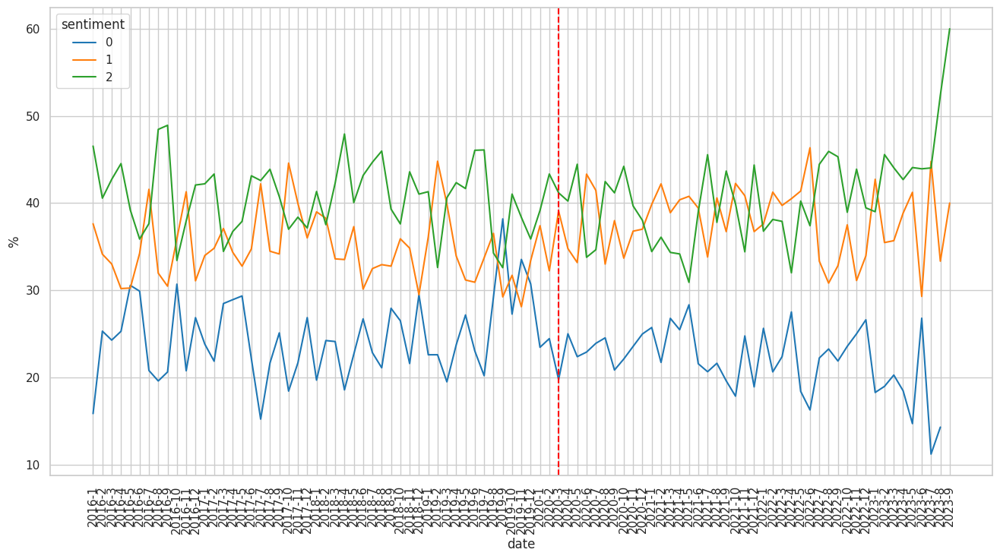

In [36]:
sns.set(rc= {'figure.figsize':(16,8)})
sns.set_style("whitegrid")
sns.color_palette("Paired")
g = sns.lineplot(data = plot_a_su_u, x = 'date', y = '%', hue = 'sentiment', palette= "tab10")
plt.xticks(rotation=90)
g.axvline(x=50, color='red', linestyle='--')

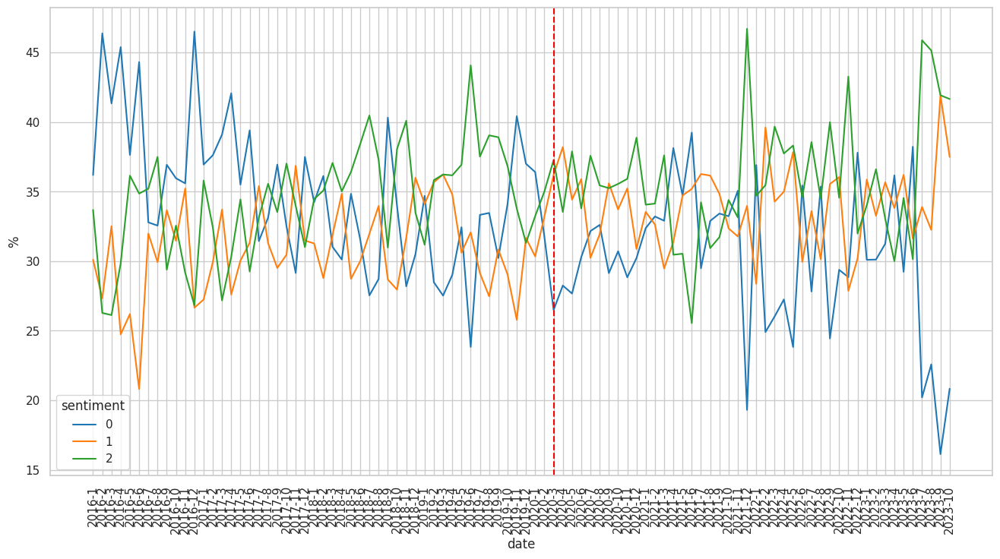

In [39]:
sns.set(rc= {'figure.figsize':(16,8)})
sns.set_style("whitegrid")
sns.color_palette("Paired")
g = sns.lineplot(data = plot_a_u_u, x = 'date', y = '%', hue = 'sentiment', palette= "tab10")
plt.xticks(rotation=90)
g.axvline(x=50, color='red', linestyle='--')

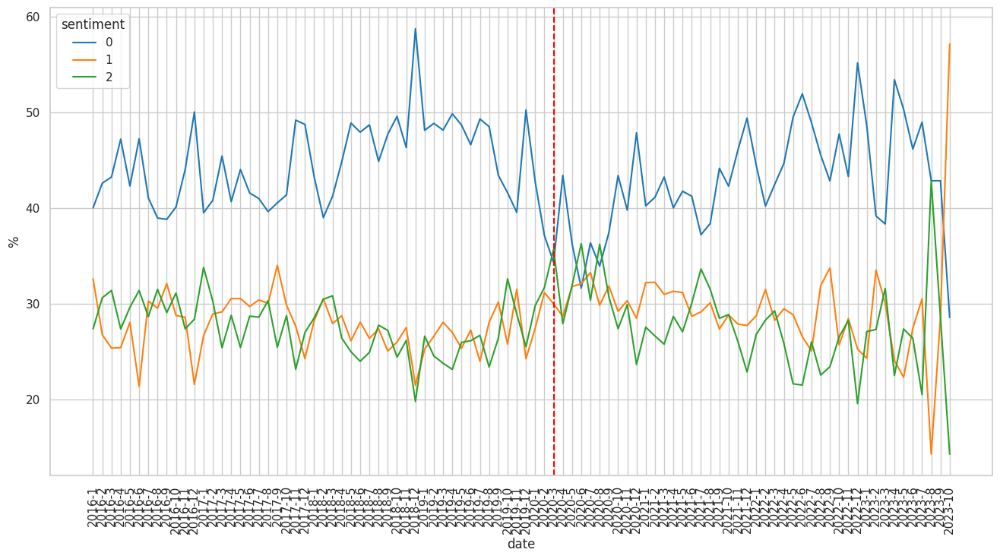

In [38]:
sns.set(rc= {'figure.figsize':(16,8)})
sns.set_style("whitegrid")
sns.color_palette("Paired")
g = sns.lineplot(data = plot_l_su_u, x = 'date', y = '%', hue = 'sentiment', palette= "tab10")
plt.xticks(rotation=90)
g.axvline(x=50, color='red', linestyle='--')

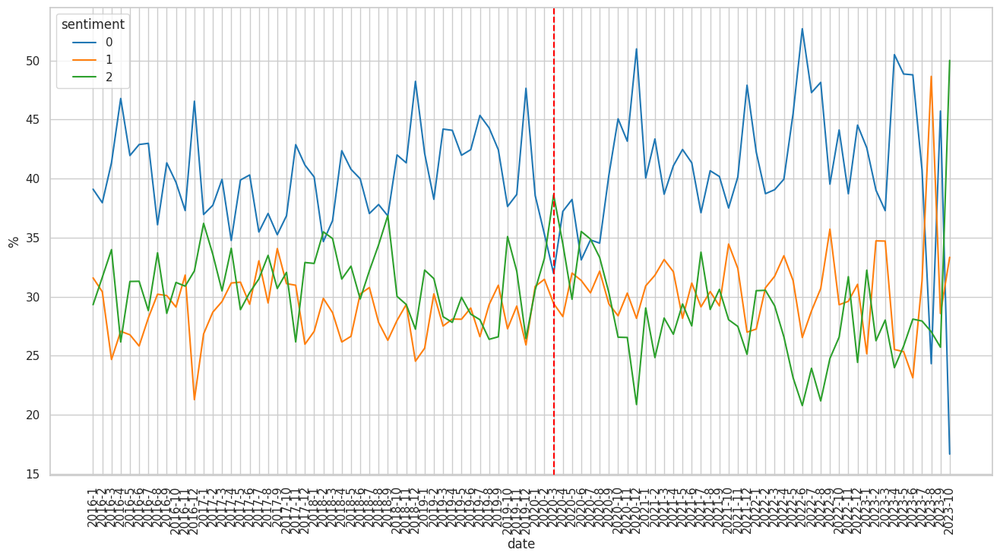

In [41]:
sns.set(rc= {'figure.figsize':(16,8)})
sns.set_style("whitegrid")
sns.color_palette("Paired")
g = sns.lineplot(data = plot_l_u_u, x = 'date', y = '%', hue = 'sentiment', palette= "tab10")
plt.xticks(rotation=90)
g.axvline(x=50, color='red', linestyle='--')

## total communities time series 

In [11]:
plot_a_tot = prepare_df_sentiment_hist_series(pd.concat([df_a_su_u, df_a_u_u], ignore_index = True))
plot_l_tot = prepare_df_sentiment_hist_series(pd.concat([df_l_su_u, df_l_u_u], ignore_index = True))

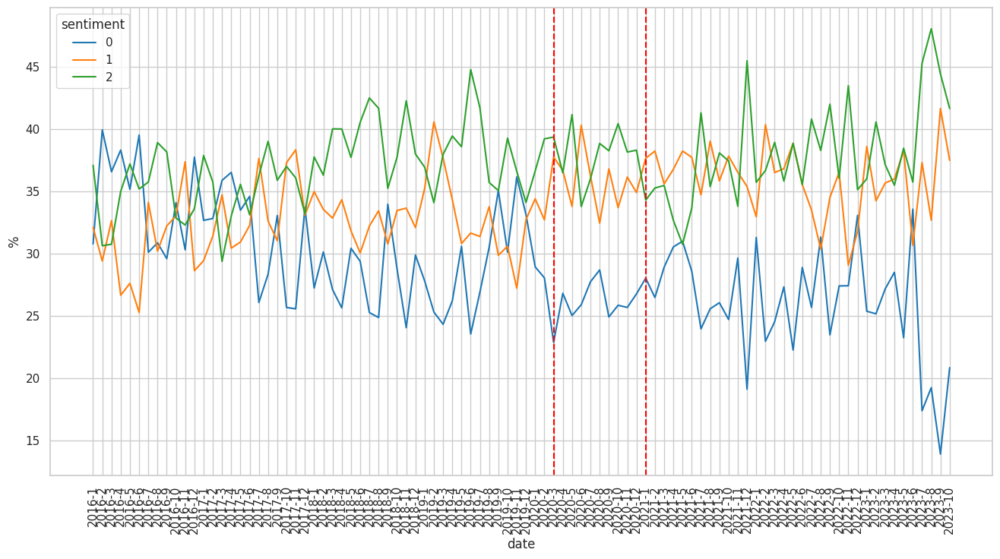

In [8]:
sns.set(rc= {'figure.figsize':(16,8)})
sns.set_style("whitegrid")
sns.color_palette("Paired")
g = sns.lineplot(data = plot_a_tot, x = 'date', y = '%', hue = 'sentiment', palette= "tab10")
plt.xticks(rotation=90)
g.axvline(x=50, color='red', linestyle='--')
g.axvline(x=60, color='red', linestyle='--')

#### Lungs

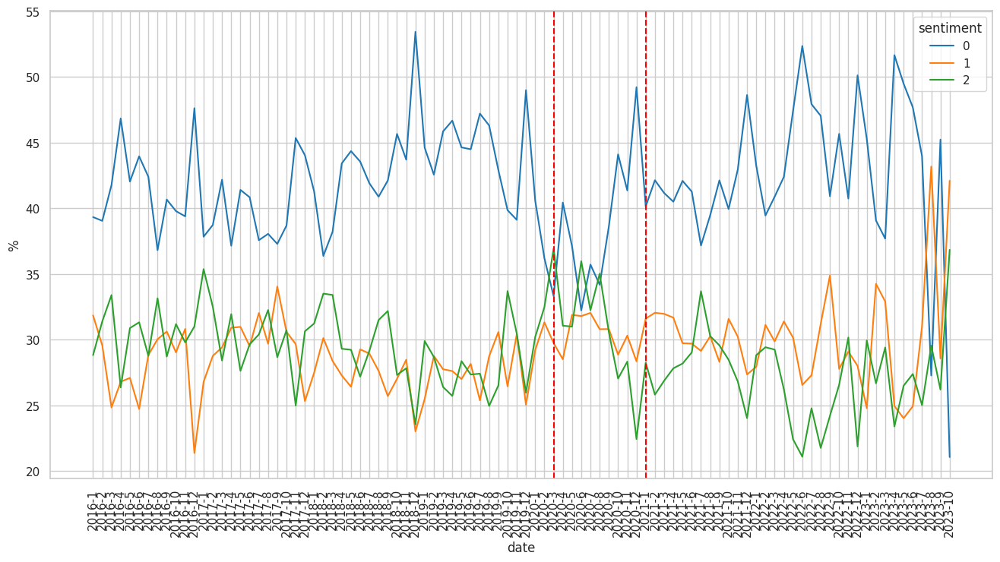

In [12]:
sns.set(rc= {'figure.figsize':(16,8)})
sns.set_style("whitegrid")
sns.color_palette("Paired")
g = sns.lineplot(data = plot_l_tot, x = 'date', y = '%', hue = 'sentiment', palette= "tab10")
plt.xticks(rotation=90)
g.axvline(x = 50, color='red', linestyle='--')
g.axvline(x = 60, color='red', linestyle='--')

## sentiment change time series

In [18]:
plot_a_tot = prepare_df_sentiment_hist_series(pd.concat([df_a_su_u, df_a_u_u], ignore_index = True), "change_sentiment")

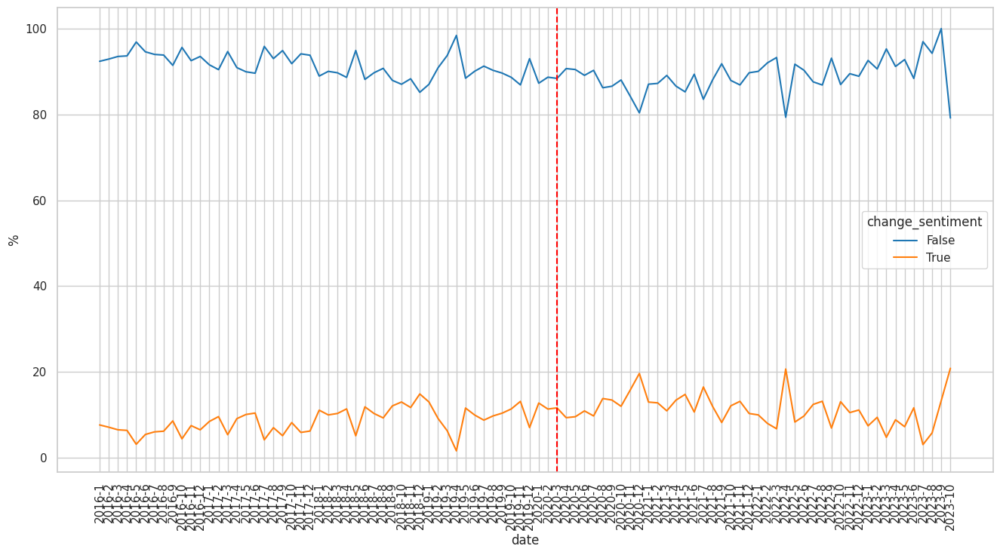

In [19]:
sns.set(rc= {'figure.figsize':(16,8)})
sns.set_style("whitegrid")
sns.color_palette("Paired")
g = sns.lineplot(data = plot_a_tot, x = 'date', y = '%', hue = 'change_sentiment', palette= "tab10")
plt.xticks(rotation=90)
g.axvline(x=50, color='red', linestyle='--')

#### Lungs

In [9]:
topic_model = BERTopic.load("Bertopic/lungs_tot")

In [7]:
year_month_series = pd.concat([df_l_su_u[~ df_l_su_u.duplicated("text_lemmatised")]["time"], df_l_u_u[~ df_l_u_u.duplicated("text_lemmatised")]["time"]], ignore_index= True).dt.to_period('M')
distinct_months = year_month_series.nunique()
docs = pd.concat([df_l_su_u[~ df_l_su_u.duplicated("text_lemmatised")]["text_lemmatised"], df_l_u_u[~ df_l_u_u.duplicated("text_lemmatised")]["text_lemmatised"]], ignore_index= True).to_list()
distinct_months

94

In [11]:
timestamps = pd.concat([df_l_su_u[~ df_l_su_u.duplicated("text_lemmatised")]["time"], df_l_u_u[~ df_l_u_u.duplicated("text_lemmatised")]["time"]], ignore_index= True).to_list()
topics_over_time = topic_model.topics_over_time(docs, timestamps, nr_bins = 100)

topic_model.visualize_topics_over_time(topics_over_time, topics=[i for i in range(10)])

#### Asthma

In [29]:
df_a = pd.read_csv("/home/deduce-ubuntu/Tesi/Tesi/bozze_df_analysis_sentiment/df_a_type_interaction_su_u.csv")

In [30]:
for thread in df_a[df_a.type_interaction == "no_change"].thread.unique():
    df = df_a[(df_a.thread == thread) & (df_a.type_interaction == "no_change")]
    authors_and_type = df[["author", "is_su"]]
    author_changed_sentiment = df.iloc[0].author
    if authors_and_type[authors_and_type.author != author_changed_sentiment]["is_su"].unique().shape[0] == 1:  #se c'è solo su = True
        indexes = df_a[df_a.thread == thread].index
        df_a.loc[indexes, "category_interaction"] = "only_su"
    else:  # se c'è sia is_su = true e is_su = false
        indexes = df_a[df_a.thread == thread].index
        df_a.loc[indexes, "category_interaction"] = "su_&_user"

In [11]:
df_category_type = pd.concat([df_a_su_u, df_a_u_u], ignore_index = True)
df_category_type = df_category_type[df_category_type.change_sentiment == True].groupby("thread")["category_interaction"].unique().reset_index()
df_category_type["category_interaction"] = df_category_type["category_interaction"].apply(lambda x: x[0]) 
df_category_type.value_counts("category_interaction")

category_interaction
only_su      1295
su_&_user     329
Name: count, dtype: int64

In [31]:
df_a = df_a[df_a.type_interaction == "no_change"].groupby("thread")["category_interaction"].unique().reset_index()
df_a["category_interaction"] = df_a["category_interaction"].apply(lambda x: x[0]) 
df_a.value_counts("category_interaction")

category_interaction
only_su      826
su_&_user    480
Name: count, dtype: int64

#### BLF

In [32]:
df_l = pd.read_csv("bozze_df_analysis_sentiment/df_lungs_type_interaction.csv")

In [33]:
for thread in df_l[df_l.type_interaction == "no_change"].thread.unique():
    df = df_l[(df_l.thread == thread) & (df_l.type_interaction == "no_change")]
    authors_and_type = df[["author", "is_su"]]
    author_changed_sentiment = df.iloc[0].author
    if authors_and_type[authors_and_type.author != author_changed_sentiment]["is_su"].unique().shape[0] == 1:  #se c'è solo su = True
        indexes = df_l[df_l.thread == thread].index
        df_l.loc[indexes, "category_interaction"] = "only_su"
    else:  # se c'è sia is_su = true e is_su = false
        indexes = df_l[df_l.thread == thread].index
        df_l.loc[indexes, "category_interaction"] = "su_&_user"

In [16]:
df_category_type = pd.concat([df_l_su_u, df_l_u_u], ignore_index = True)
df_category_type = df_category_type[df_category_type.change_sentiment == True].groupby("thread")["category_interaction"].unique().reset_index()
df_category_type["category_interaction"] = df_category_type["category_interaction"].apply(lambda x: x[0]) 
df_category_type.value_counts("category_interaction")

category_interaction
only_su      6635
su_&_user    1149
Name: count, dtype: int64

In [34]:
df_l = df_l[df_l.type_interaction == "no_change"].groupby("thread")["category_interaction"].unique().reset_index()
df_l["category_interaction"] = df_l["category_interaction"].apply(lambda x: x[0]) 
df_l.value_counts("category_interaction")

category_interaction
only_su      3410
su_&_user    1385
Name: count, dtype: int64

### Check lenght answer

In [3]:
df_a = pd.concat([df_a_su_u, df_a_u_u], ignore_index = True)

In [13]:
df_a["lenght"] = df_a["text"].apply(len)
print(df_a[(df_a.change_sentiment == False) & (df_a.is_su == False)]["lenght"].mean())
print(df_a[(df_a.change_sentiment == True) & (df_a.is_su == False)]["lenght"].mean())
print(df_a[(df_a.change_sentiment == False) & (df_a.is_su == True)]["lenght"].mean())
df_a[(df_a.change_sentiment == True) & (df_a.is_su == True)]["lenght"].mean()

379.9116265163164
402.9788891681327
749.762078884501


626.0983952702703

### Creare excel per analisi manuale

In [7]:
lista = [1486, 1875, 4278, 7415, 7531, 9035, 9838, 16315, 21345, 22006, 36373, 44365]
df_a[(df_a.thread.isin(lista)) & (df_a.change_sentiment == True)][["author", "text", "sentiment", "thread", "is_su", "change_sentiment", "n_interactions"]].to_excel("analisi_manuale.xlsx")

In [14]:
df_a[df_a.thread == 9035].iloc[3].text

"I think a GP would expect someone to have tried the easily available treatments first, so like Gaviscon. I don't know about others but apparently gaviscon liquid is better than the tablets. If that works when taken regularly then doctors seem happy (based on friends/family experiences) to prescribe PPIs. But I don't know if this is an official process or anything."

In [16]:
import random 

random.seed(30)
choices = random.choices(df_a[df_a.change_sentiment == True].thread.unique(), k = 25)

In [18]:
df_a[(df_a.thread.isin(choices)) & (df_a.change_sentiment == True)][["author", "text", "sentiment", "thread", "is_su", "change_sentiment", "n_interactions"]].to_excel("analisi_manuale_2.xlsx", index = False)

### topic model info

In [10]:
# topic_model = BERTopic.load("Bertopic/asthma_total")
topic_model = BERTopic.load("Bertopic/lungs_tot")

In [9]:
topic_model.get_topic_info().iloc[-1]["Representation"]

['finger',
 'cross',
 'restful',
 'postpone',
 'smoothly',
 'dream',
 'apprehensive',
 'blip',
 'wheezing',
 'def']

In [8]:
topic_model.get_topic_info() #asthma

,Topic,Count,Name,Representation,Representative_Docs
0,-1,46605,-1_asthma_feel_not_day,"[asthma, feel, not, day, work, chest, think, h...",NaN
1,0,1393,0_child_daughter_son_school,"[child, daughter, son, school, old, young, par...",NaN
2,1,1291,1_vaccine_jab_flu_vaccination,"[vaccine, jab, flu, vaccination, group, vaccin...",NaN
3,2,855,2_asthmauk_uk_asthma_asthmagirl,"[asthmauk, uk, asthma, asthmagirl, asthmatic, ...",NaN
4,3,845,3_symbicort_smart_puff_regime,"[symbicort, smart, puff, regime, duoresp, 2006...",NaN
...,...,...,...,...,...
564,563,10,563_spiriva_gargleteeth_itl_fostairbut,"[spiriva, gargleteeth, itl, fostairbut, saviou...",NaN
565,564,10,564_pls_remedy_hilary39you_herbalhome,"[pls, remedy, hilary39you, herbalhome, chromic...",NaN
566,565,10,565_kenalog_musclejoint_mg_6mths,"[kenalog, musclejoint, mg, 6mths, mel, mood, c...",NaN
567,566,10,566_350_pef_570_leaner,"[350, pef, 570, leaner, signifiantly, breathej...",NaN


In [13]:
topic_model.get_topic_info()[:50]

,Topic,Count,Name,Representation,Representative_Docs
0,-1,46605,-1_asthma_feel_not_day,"[asthma, feel, not, day, work, chest, think, h...",NaN
1,0,1393,0_child_daughter_son_school,"[child, daughter, son, school, old, young, par...",NaN
2,1,1291,1_vaccine_jab_flu_vaccination,"[vaccine, jab, flu, vaccination, group, vaccin...",NaN
3,2,855,2_asthmauk_uk_asthma_asthmagirl,"[asthmauk, uk, asthma, asthmagirl, asthmatic, ...",NaN
4,3,845,3_symbicort_smart_puff_regime,"[symbicort, smart, puff, regime, duoresp, 2006...",NaN
5,4,720,4_pollen_hayfever_hay_fever,"[pollen, hayfever, hay, fever, grass, tree, an...",NaN
6,5,609,5_steroid_inhaled_inhale_oral,"[steroid, inhaled, inhale, oral, inhaler, dose...",NaN
7,6,553,6_222_0300_5800_helpline,"[222, 0300, 5800, helpline, nurse, uk, mf, rin...",NaN
8,7,530,7_thrush_rinse_mouth_tooth,"[thrush, rinse, mouth, tooth, gargle, brush, t...",NaN
9,8,523,8_peak_flow_predict_average,"[peak, flow, predict, average, meter, height, ...",NaN


In [13]:
topic_model.get_topic_info().loc[0]["Representation"]

['copd',
 'asthma',
 'chest',
 'cough',
 'infection',
 'bronchiectasis',
 'hospital',
 'breathing',
 'lung',
 'inhaler']

In [10]:
topic_model.get_topic_info() #lungs

,Topic,Count,Name,Representation,Representative_Docs
0,-1,202243,-1_copd_asthma_chest_cough,"[copd, asthma, chest, cough, infection, bronch...",NaN
1,0,3493,0_vape_smoke_smoking_quit,"[vape, smoke, smoking, quit, cigarette, nicoti...",NaN
2,1,2724,1_oxygen_oximeter_level_ambulatory,"[oxygen, oximeter, level, ambulatory, organ, p...",NaN
3,2,2171,2_cancer_radiotherapy_nodule_chemo,"[cancer, radiotherapy, nodule, chemo, tumour, ...",NaN
4,3,2143,3_transplant_list_donor_harefield,"[transplant, list, donor, harefield, assessmen...",NaN
...,...,...,...,...,...
2713,2712,10,2712_height_3914_meszi_161,"[height, 3914, meszi, 161, bmi, 331, cm, 51, d...",NaN
2714,2713,10,2713_ruby_anniversary_wedding_youhugs,"[ruby, anniversary, wedding, youhugs, t2d, con...",NaN
2715,2714,10,2714_remind_feelingblessed2013_agobbccouknewsm...,"[remind, feelingblessed2013, agobbccouknewsmag...",NaN
2716,2715,10,2715_scotia_nova_lunenburg_maritime,"[scotia, nova, lunenburg, maritime, sailboat, ...",NaN


In [11]:
topic_model.get_topic_info()[:50]

,Topic,Count,Name,Representation,Representative_Docs
0,-1,202243,-1_copd_asthma_chest_cough,"[copd, asthma, chest, cough, infection, bronch...",NaN
1,0,3493,0_vape_smoke_smoking_quit,"[vape, smoke, smoking, quit, cigarette, nicoti...",NaN
2,1,2724,1_oxygen_oximeter_level_ambulatory,"[oxygen, oximeter, level, ambulatory, organ, p...",NaN
3,2,2171,2_cancer_radiotherapy_nodule_chemo,"[cancer, radiotherapy, nodule, chemo, tumour, ...",NaN
4,3,2143,3_transplant_list_donor_harefield,"[transplant, list, donor, harefield, assessmen...",NaN
5,4,1970,4_reflux_acid_omeprazole_hernia,"[reflux, acid, omeprazole, hernia, gaviscon, h...",NaN
6,5,1829,5_dog_collie_pup_puppy,"[dog, collie, pup, puppy, vet, spaniel, animal...",NaN
7,6,1643,6_foundation_british_buddy_lung,"[foundation, british, buddy, lung, lungie, for...",NaN
8,7,1369,7_emphysema_bullous_moderate_stage,"[emphysema, bullous, moderate, stage, severe, ...",NaN
9,8,1273,8_laugh_chuckle_humour_joke,"[laugh, chuckle, humour, joke, funny, laughter...",NaN
